# Kiran Shrestha
### Project title: *Channnel the bad ones out*
Link to the page: [here](https://stharajkiran.github.io/)

# Project Goals

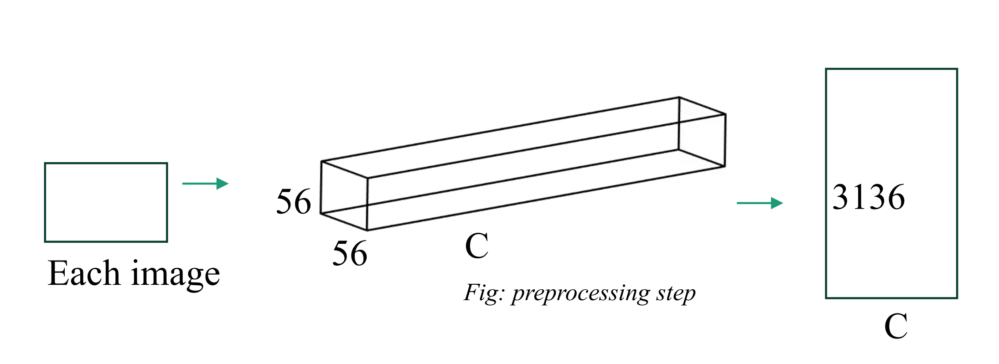

https://arxiv.org/pdf/2011.08785.pdf in this paper, they use random 100 channels out of 448. So, for each feature, the length reduces from 448 to 100. It works really well. Why do we not do the same? <br>

My project is to make the approach work when I only have images with anomalies whereares the previous work used data without anomalies for training. That's why, using random selection approach does not work well.

So, using some scoring metric for each channel in C, we try to find the best channel for the segmentaion model.

# Collaboration Plan

I plan to first work with transistor datasets. Then, I will test this on crack datasets since they are more complicated. Github will be primarily used to store all the data and notebooks.

# Import libraries

In [2]:
pip install torch

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install torchvision

Note: you may need to restart the kernel to use updated packages.


In [5]:
import cv2 
import random
import numpy as np
import os
from scipy.spatial.distance import mahalanobis
from scipy.ndimage import gaussian_filter
from skimage import morphology
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt
import matplotlib
import cv2 as cv
from PIL import Image
import torch
# For 
import fft_filter_normalized as fft_filter
import torch.nn.functional as F


# Function to plot the figures

In [6]:
def plot_fig(test_imgs, scores, fix_ratios, save_dir = "", save = False, title  = ""):
    """
    test_imgs: : real crack images 
    scores: test scores for test images 
    fix_ratio: fix_ratio for mask
    save_dir: location of directory for saving the images 
    """
    class_name = "test " #+ str(fix_ratio)
    num = len(test_imgs)
    vmax = scores.max() * 255.
    vmin = scores.min() * 255.
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    for i in range(num):
        # Plotting
        fig_img, ax_img = plt.subplots(4, 4, figsize=(24,26))
        fig_img.tight_layout(pad = 0)
        fig_img.subplots_adjust(top=0.9) 
        fig_img.subplots_adjust(right=0.9) 
        norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
        for row in ax_img:
            for ax_i in row:
                ax_i.axes.xaxis.set_visible(False)
                ax_i.axes.yaxis.set_visible(False)

    ##############################################################
         
        # padim only
        img = test_imgs[i]
        img = denormalization(img)
        for j,fix_ratio in enumerate(fix_ratios):
            heat_map = scores[i] * 255
            mask = scores[i].copy()
            mask_max = mask.max()
            mask_min = mask.min()
            # threshold
            threshold = mask_min + fix_ratio * (mask_max - mask_min)
            mask[mask > threshold] = 1
            mask[mask <= threshold] = 0
            kernel = morphology.disk(4)
            mask = morphology.opening(mask, kernel)
            mask *= 255
            vis_img = mark_boundaries(img, mask, color=(1, 0, 0), mode='thick')
            #############################################################
            # 1st, main image
            ax_img[j,0].imshow(img)
            ax_img[j,0].title.set_text('original image')

            # 2nd, PADIM Predicted heat map
            ax = ax_img[j,1].imshow(heat_map, cmap='jet', norm=norm)
            ax_img[j,1].imshow(img, cmap='gray', interpolation='none')
            ax_img[j,1].imshow(heat_map, cmap='jet', alpha=0.5, interpolation='none')
            ax_img[j,1].title.set_text(f'Predicted heat map with fix_ratio {fix_ratio}')

            # 3rd, PADIM Predicted mask
            ax_img[j, 2].imshow(mask, cmap='gray')
            ax_img[j, 2].title.set_text(f'Predicted mask with fix_ratio {fix_ratio}')

            # 4th, PADIM Segmentation result
            ax_img[j, 3].imshow(vis_img)
            ax_img[j, 3].title.set_text(f'Segmentation result with fix_ratio {fix_ratio}')

        left = 0.92
        bottom = 0.15
        width = 0.015
        height = 1 - 2 * bottom
        rect = [left, bottom, width, height]
        cbar_ax = fig_img.add_axes(rect)
        cb = plt.colorbar(ax, shrink=0.6, cax=cbar_ax, fraction=0.046)
        cb.ax.tick_params(labelsize=8)
        font = {
            'family': 'serif',
            'color': 'black',
            'weight': 'normal',
            'size': 8,
        }
        cb.set_label('Anomaly Score', fontdict=font)
        plt.suptitle(title)
        if save:
            os.makedirs(save_dir + '/compare_imgs/', exist_ok=True)
            fig_img.savefig(os.path.join(save_dir + '/compare_imgs/', class_name + str(i)), dpi=100)
            plt.close()
        else:
            plt.show()
            plt.close()
            break

def denormalization(x):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    x = (((x.transpose(1, 2, 0) * std) + mean) * 255.).astype(np.uint8)
    
    return x

# data loading

In [7]:
# device setup
use_cuda = torch.cuda.is_available()
device = torch.device('cuda' if use_cuda else 'cpu')

In [8]:
device

device(type='cpu')

In [9]:
def get_img_embed():
    train_embedding_vectors = np.load( "data/train_np.npy")
    test_embedding_vectors = np.load( "data/test_np.npy")
    test_imgs = np.load("data/test_imgs.npy")
    bad = np.load("data/raw_imgs.npy")
    good = np.load( "data/good_imgs.npy")
    return bad, good, train_embedding_vectors, test_embedding_vectors,test_imgs 

In [10]:
# bad_1024, good_1024, train_embed, test_embed, test_imgs_224 = get_img_embed()
_, _, train_embed, test_embed, test_imgs_224 = get_img_embed()

In [11]:
# print("images with anomalies", bad_1024.shape)
# print("normal images", good_1024.shape)
print("train embedding", train_embed.shape)
print("test embedding", test_embed.shape)
print("resnet fit resized test images for visulization purpose", test_imgs_224.shape)

train embedding (213, 448, 56, 56)
test embedding (10, 448, 56, 56)
resnet fit resized test images for visulization purpose (10, 3, 224, 224)


## Visualization 

### Check the channels randomly

In [11]:
idx = random.sample(range(448), 9)

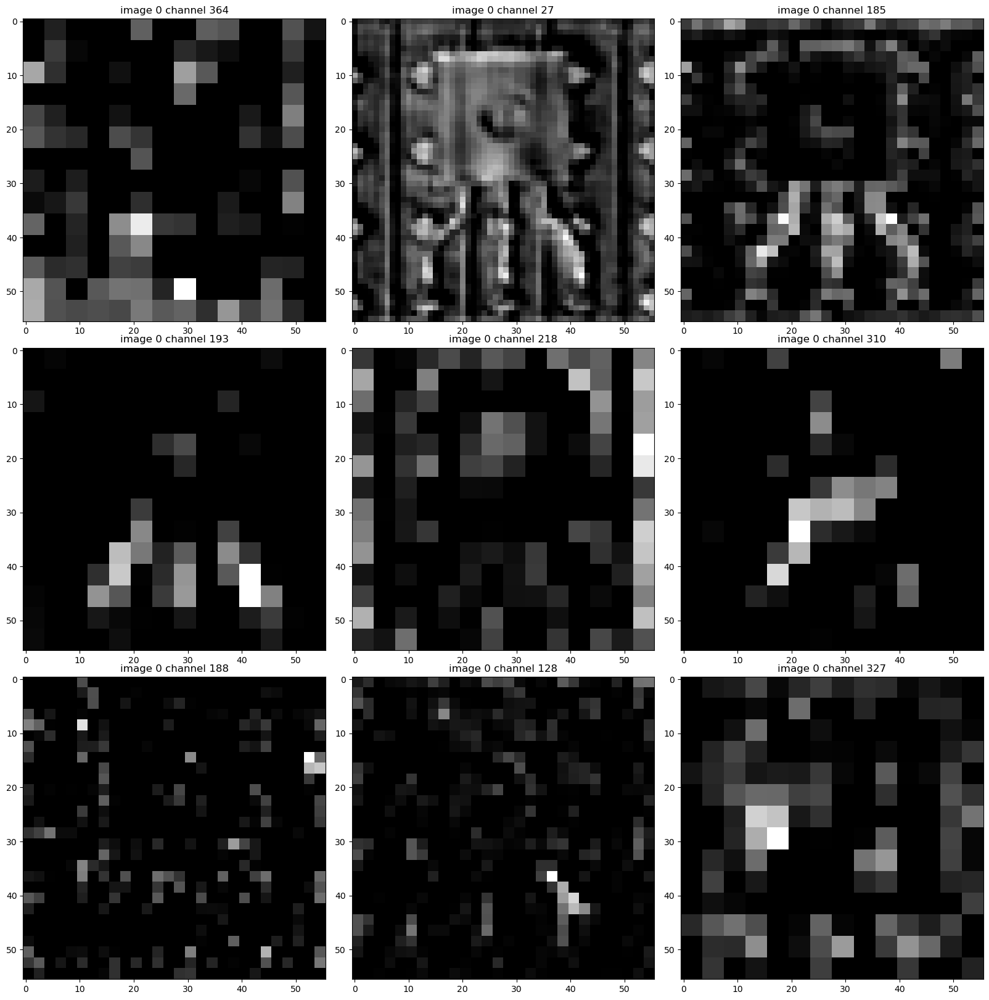

In [12]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = idx[3*i+j]
        channel = train_embed[img_num][channel_num]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"image {img_num} channel {channel_num}"  ) 
plt.show()                      

We see that lower channel number gives much better details of the image.

## Check the channels sequentially

__The initial channels are from first layer. So, it depicts low level information of the image__

### very low level info

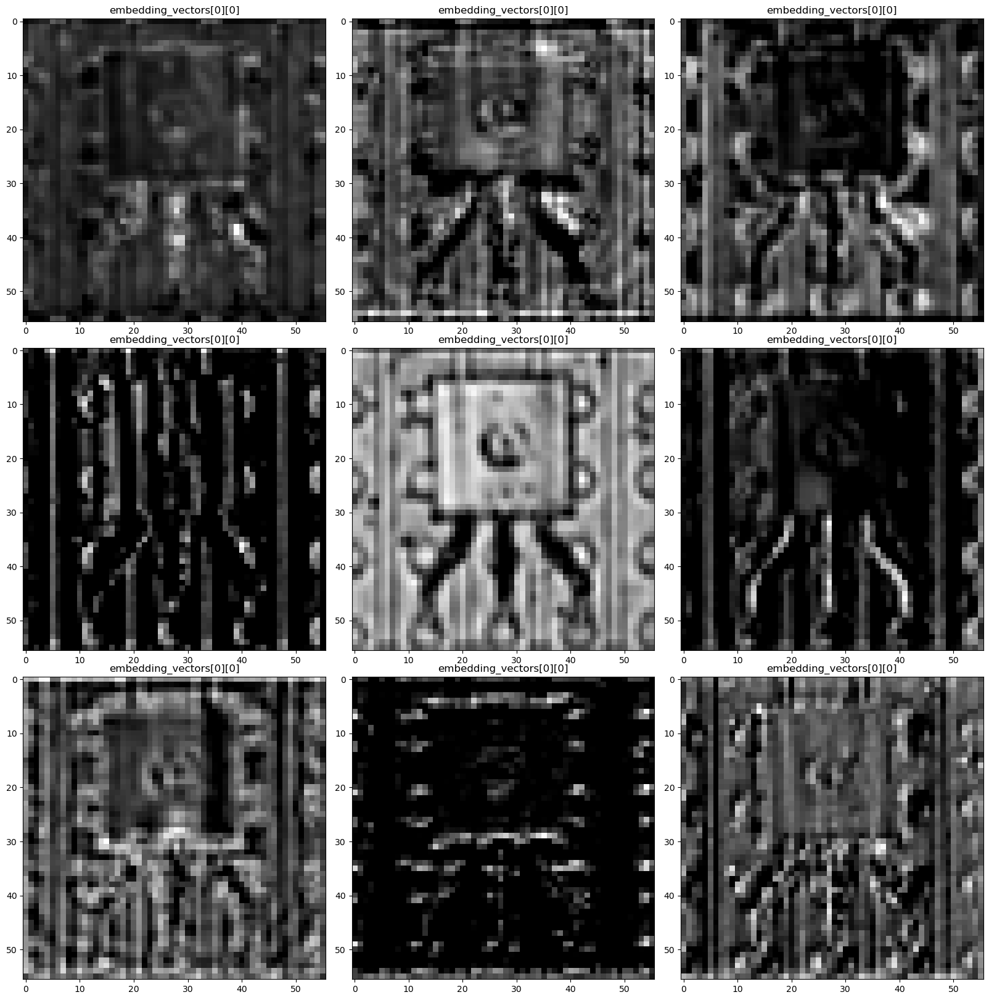

In [14]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 0
        channel = train_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

### as we go higher, more abstract info

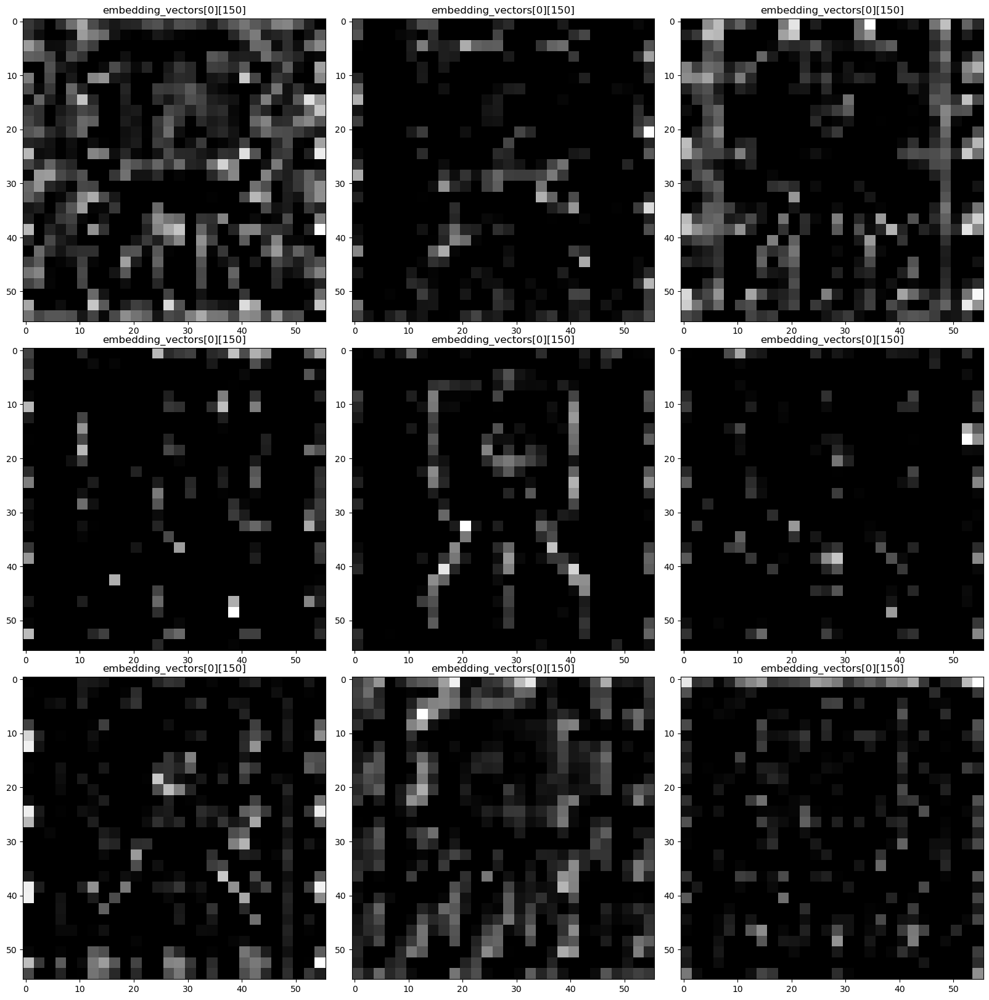

In [15]:
figure, axis = plt.subplots(3, 3 , figsize=(16, 16))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 150
        channel = train_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num}]"  ) 
plt.show()                      

### Very abstract info

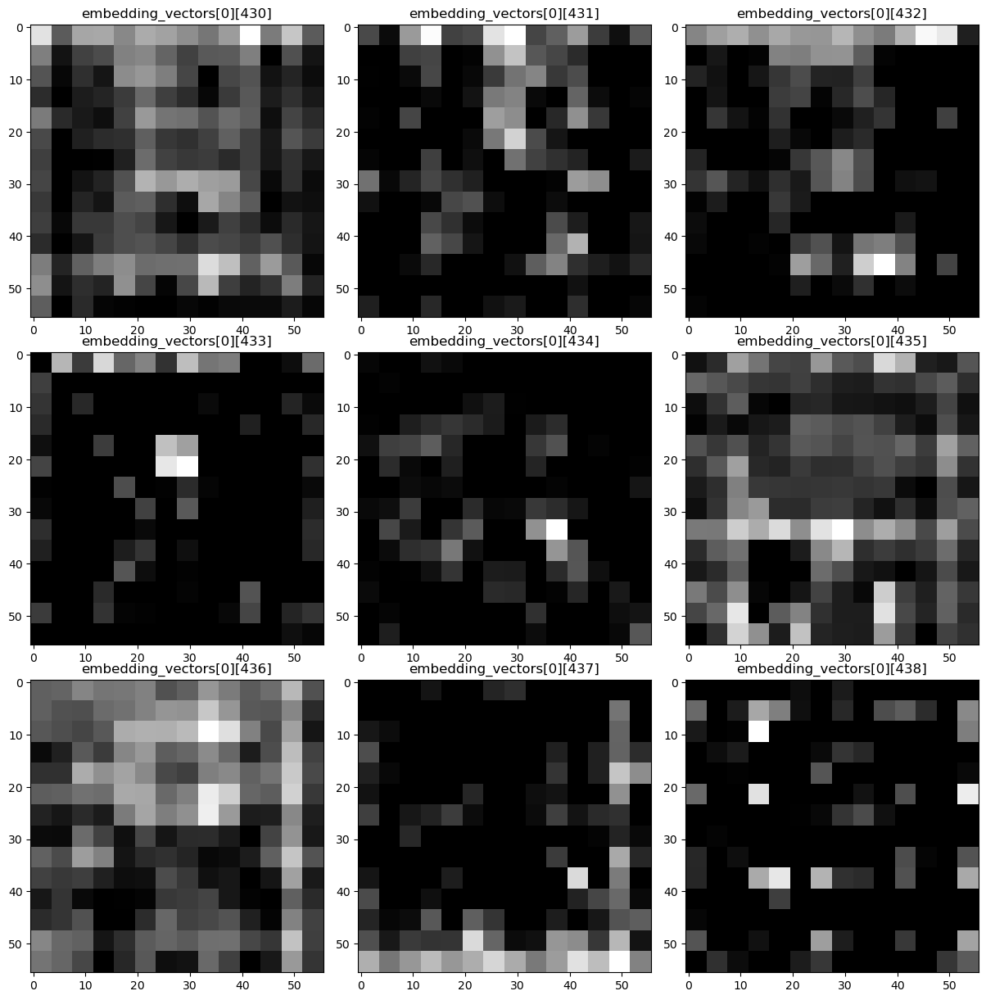

In [16]:
figure, axis = plt.subplots(3, 3 , figsize=(12, 12))
figure.tight_layout(pad = 0)
for i in range(3):
    for j in range(3):
        img_num = 0
        channel_num = 430
        channel = train_embed[img_num][channel_num + 3*i + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*i + j}]"  ) 
plt.show()                      

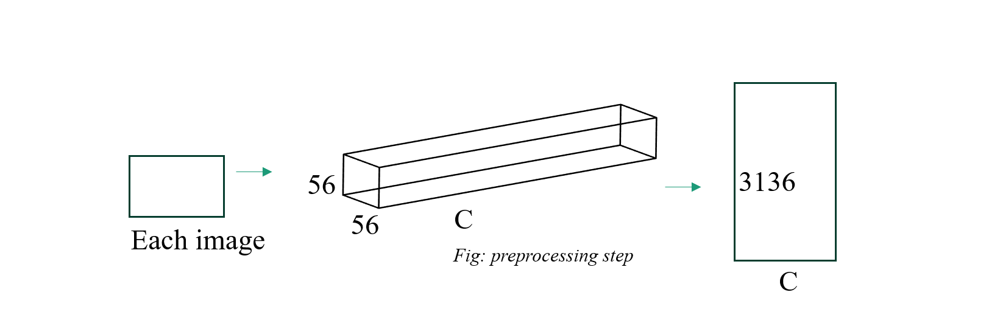

To explain the data we are working with, each image is converted into 56 x 56 x C, where C = 448. C represents channels in theory, but we can treat it as a single image (56 x 56) or a vector of length 3136. <br>
Again, each channel C is a vector of some length (3136 in the figure). Similarly, each value out of 3136 above represents one particular feature of the image. It is of side C x 1. The feature is what we work with later for modeling gaussian distribution. So, there are two ways we see this, one from feature perspective and aother from channel.

https://arxiv.org/pdf/2011.08785.pdf in this paper, they use random 100 channels out of 448. So, for each feature, the length reduces from 448 to 100. It works really well. Why do we not do the same? <br>

My project is to make the approach work when I only have images with anomalies whereares the previous work used data without anomalies for training. That's why, using random selection approach does not work well.

The question is which channels do we select or not select so that we can avoid the anomalous representation, i.e we traing with only non anomalous channels. If we  do that, the performance should be better.

### How is this a data science problem? 

- What is the data? Here a unit data is the (3136 x C) 2D array. (feature and channels) 
- What is EDA? I did that above, and there will be more while doing feature selection.
- What is the variable? Each feature row has C variables (here variable is the data science feature !!!!)
- What is the channel?We can consider this channel selection appraoch as variable selection in normal data science project (I used variable because I already used the term "feature" earlier.). Think the channels we are trying to avoid are the features that makes the model's performace worse.
- What is the model? We use gaussian distribution model to classify each feature (out of 3136) as anomalous or not.

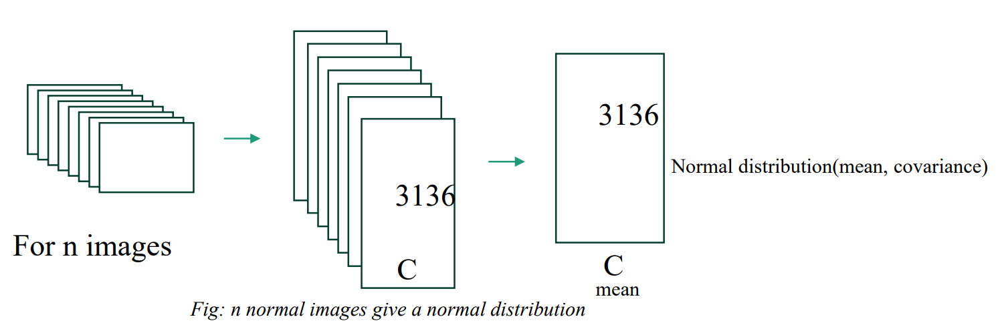

__Big question is how do we remove the unwanted channels?__

## Are the channels at same index same for different images ?

__We take two images to check if channels at same index are same or not.__

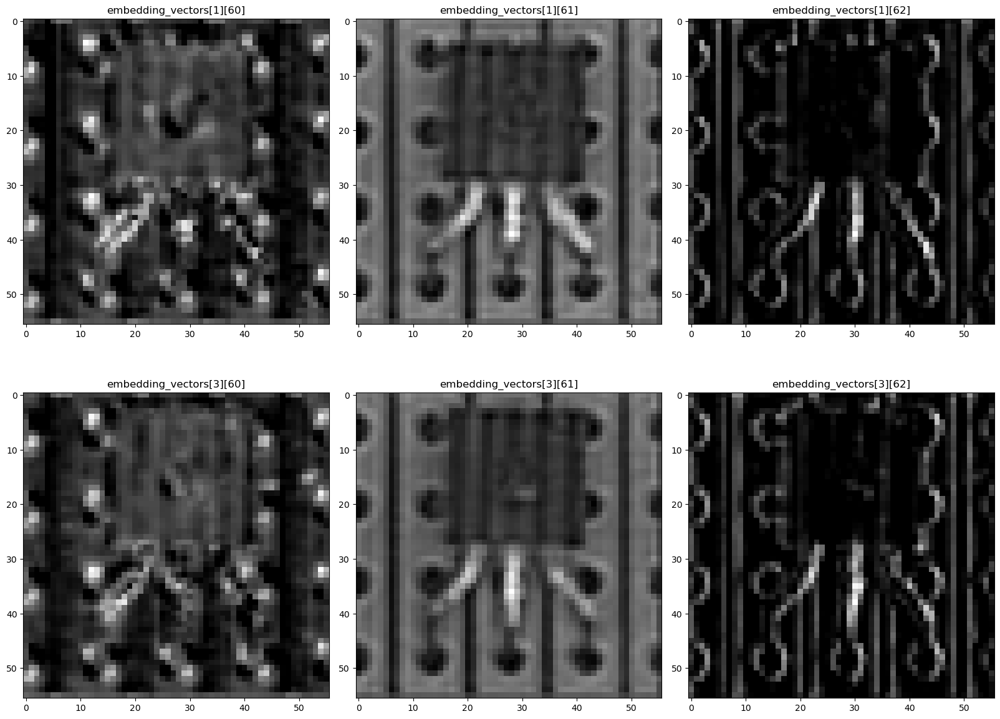

In [17]:
figure, axis = plt.subplots(2, 3 , figsize=(16, 12))
figure.tight_layout(pad = 0)
nums = [1, 3]
for i in range(2):
    k = 0
    for j in range(3):
        img_num = nums[i]
        channel_num = 60
        channel = train_embed[img_num][channel_num + 3*k + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*k + j}]"  ) 
plt.show()                      

__Double check?__

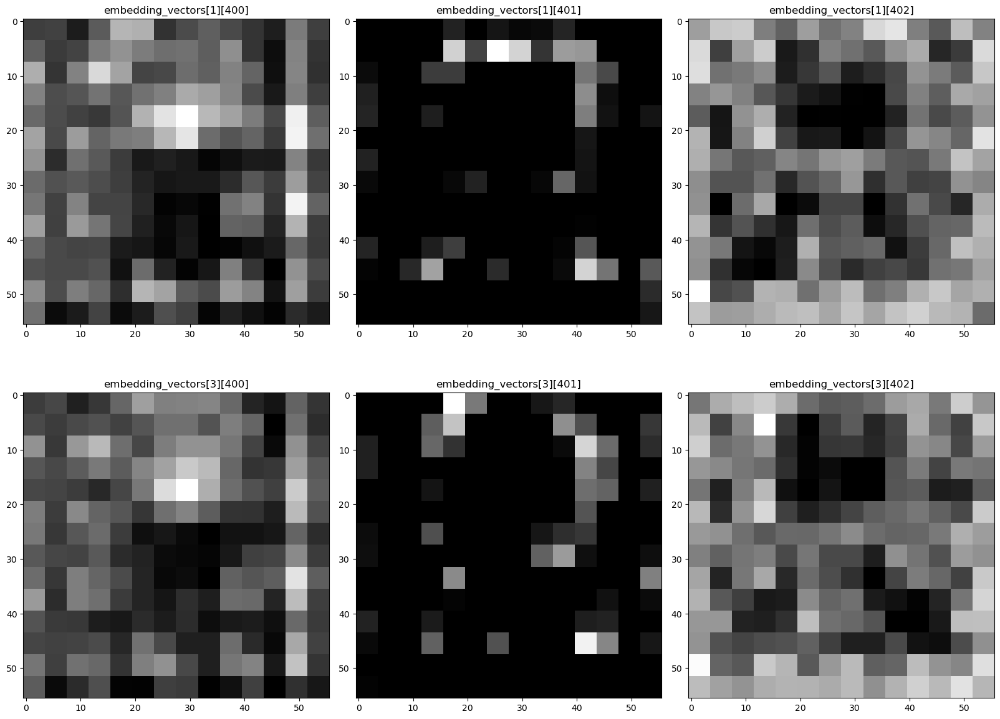

In [18]:
figure, axis = plt.subplots(2, 3 , figsize=(16, 12))
figure.tight_layout(pad = 0)
nums = [1, 3]
for i in range(2):
    k = 0
    for j in range(3):
        img_num = nums[i]
        channel_num = 400
        channel = train_embed[img_num][channel_num + 3*k + j]
        axis[i,j].imshow(channel, cmap = "gray")
        axis[i,j].set_title(f"embedding_vectors[{img_num}][{channel_num + 3*k + j}]"  ) 
plt.show()                      

## They are kind of similar.

.

# How do we select "good" channels and "bad" ones. <br>(Good are the ones we want)

THe assumption is bad channels that represent the anamolity 

# Sort the channels based on distances

- we take each channel and find the euclidean distance between itself and the low pass filtered form using FFT.
- we sort the distance and rank.
- We try the model.

In [12]:
# Distance betweeb channel and its fft with raidus 20, 0
def calculateDistance(c):
    channel = c.copy()
    obj = fft_filter.fft(torch.from_numpy(channel))
    c_fft = obj(20,0)
    if np.isnan(c_fft).all():
        return 0.00
    return ((channel-c_fft)**2).sum()

def filter_channels(embedding_vectors, a, b):
    embed_np = embedding_vectors.numpy().copy()
    _imgs = []
    # dictionary for each image with all its channels
    for img_id, image in enumerate(embed_np):
        # stores all the distances of channel and its fft
        channel_dist = {}
        channel_dict = {}
        for channel_id, channel in enumerate(image):
            channel_dist[channel_id] = calculateDistance(channel)
            channel_dict[channel_id] = channel
        # Sort the dictionary
        channel_dist = dict(sorted(channel_dist.items(), key=lambda item: item[1]))
        # select top 100 channels and replace it in the original dictonary 
        channel_dict = {k: channel_dict[k] for k in list(channel_dist.keys())[a:b]}
        # append to the list
        _imgs.append(channel_dict)
    
    return _imgs

In [21]:
# Take lowest 100 distance
embedding_vectors_dict = filter_channels(torch.tensor(train_embed), 0, 100)
embedding_vectors = np.array([np.array(list(im_dict.values())) for im_dict in embedding_vectors_dict])
embedding_vectors = torch.from_numpy(embedding_vectors)

/home/jovyan/notebooks/final project/fft_filter_normalized.py:106: RuntimeWarning: invalid value encountered in divide
  img = img / (_max - _min)
/home/jovyan/notebooks/final project/fft_filter_normalized.py:41: RuntimeWarning: invalid value encountered in cast
  img_mandp = np.uint8(np.abs(np.fft.ifft2(img_mandp)))
/home/jovyan/notebooks/final project/fft_filter_normalized.py:44: RuntimeWarning: invalid value encountered in divide
  img_mandp=img_mandp/np.max(img_mandp)*255


In [22]:
embedding_vectors.shape

torch.Size([213, 100, 56, 56])

# Check how this filtered data will do

## Functions for finding gaussian distribution and mahalanobis distance

In [13]:
def get_gaussian(embedding_vectors): 
    distribution = []
    B, C, H, W = embedding_vectors.shape
    embedding_vectors = embedding_vectors.view(B, C, H * W)
    mean = torch.mean(embedding_vectors, dim=0).numpy()

    # shape C, C,3136
    cov = torch.zeros(C, C, H * W).numpy()

    I = np.identity(C)

    # Covariance for each feature index
    for i in range(H * W):
        # Each C x C from C x C x (H * W)
        cov[:, :, i] = np.cov(embedding_vectors[:, :, i].numpy(), rowvar=False) + 0.01 * I
    return [mean, cov]

def get_scores(embedding_vectors, normal_distribution):
    """
        Args: 
        embedding_vectors: all the test input      
    """
    B, C, H, W = embedding_vectors.size()
    embedding_vectors = embedding_vectors.view(B, C, H * W).numpy()
    dist_list = []

    for i in range(H * W):
        # ith feature mean, shape (100,)
        # Each specific attrribute is represented by 100 x 1 mean vector
        mean = normal_distribution[0][:, i]

        # Inverse of covariance of ith feature
        conv_inv = np.linalg.inv(normal_distribution[1][:, :, i])

        """
        _img: 100 channels and 3136 feature indices, shape = (100, 3136) for particular image
        _img[:, i] shape (100,); for ith feature gives all 100 channel values 
        """ 

        dist = [mahalanobis(_img[:, i], mean, conv_inv) for _img in embedding_vectors]
        dist_list.append(dist)

    # Reshaping to 449 x 56 x 56
    dist_list = np.array(dist_list).transpose(1, 0).reshape(B, H, W)
    # Numpy into tensor
    dist_list = torch.tensor(dist_list)
    # unsqueeze adds dimenstion and new dimension is (449, 1, 56, 56)
    # size is 224, which is size of original img
    # squeeze() removes the single dimensions
    score_map = F.interpolate(dist_list.unsqueeze(1), size= 224, mode='bilinear', align_corners=False).squeeze().numpy()

    # apply gaussian smoothing on the score map (on each 56 x 56 imgs)
    for i in range(score_map.shape[0]):
        score_map[i] = gaussian_filter(score_map[i], sigma=4)

    # Normalization
    max_score = score_map.max()
    min_score = score_map.min()
    _scores = (score_map - min_score) / (max_score - min_score)
    return _scores

## Get gaussian distribution and scores

In [24]:
mean, cov = get_gaussian(embedding_vectors)

In [25]:
# Anomaly score
scores = get_scores(embedding_vectors,(mean, cov))

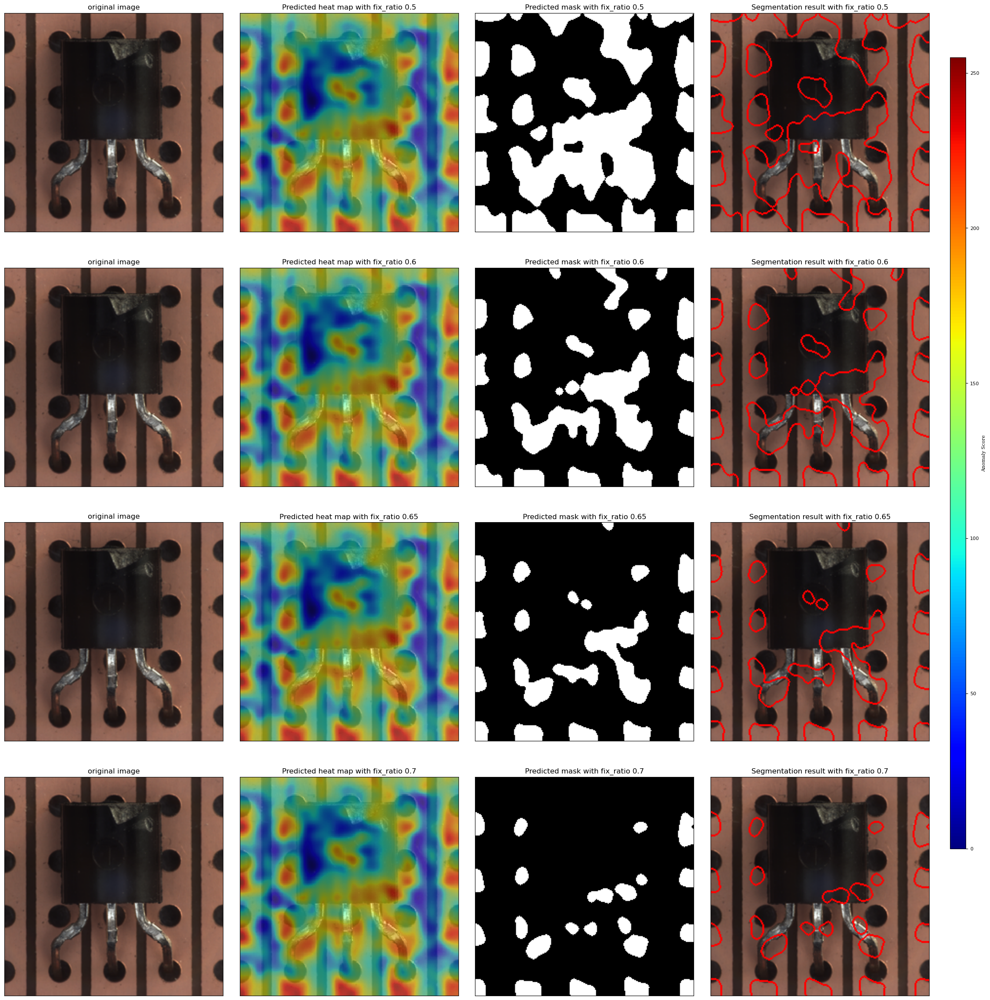

In [26]:
save = False
fix_ratios = [0.5, 0.6, 0.65, 0.7]
plot_fig(test_imgs_224 ,scores, fix_ratios)

## NOTE: we have four rows here. Each row represent segmenting below certain threshold of score value. For example, above I have used 0.5.6, 0.65, 0.7.

__So we have a very terrible segmentation here.__

During channel selection. It is important that the channels we get are from same indices across all the images.

# Take three images and compare if the channels align similarly

In [27]:
# embedding_vectors_dict is the list of dictionaries for each image where value are the channels ordered
len(embedding_vectors_dict)

213

In [28]:
embedding_vectors_dict[0].keys()

dict_keys([272, 208, 320, 254, 342, 329, 308, 228, 319, 144, 155, 397, 189, 370, 417, 257, 305, 128, 297, 67, 164, 266, 137, 143, 341, 418, 362, 114, 188, 158, 153, 87, 434, 306, 182, 421, 179, 369, 135, 177, 203, 242, 373, 89, 13, 151, 125, 154, 304, 84, 181, 191, 146, 269, 98, 190, 232, 33, 442, 85, 117, 337, 97, 139, 159, 393, 368, 246, 360, 288, 356, 401, 343, 439, 120, 126, 195, 292, 217, 136, 209, 156, 201, 258, 259, 112, 172, 178, 284, 115, 406, 193, 331, 133, 392, 239, 95, 175, 99, 287])

In [29]:
# Take three images
img_idx = [0 ,2, 5]
scatter_list = {}
for i in img_idx:
    # The order of channels given by dictionary keys
    order = embedding_vectors_dict[i].keys()
    scatter_list[i] = order

scatter_list has the indices of 100 ordered channels. 

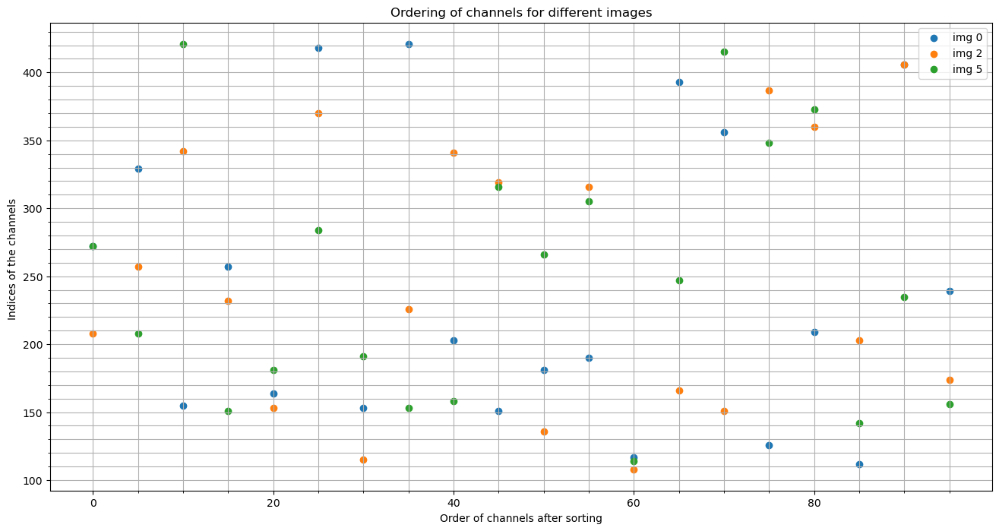

In [30]:
# Slice the indices
indices = list(range(0,100,5))
# Channels for given index in each image
img0_order = [ list(scatter_list[0])[i] for i in indices]
img2_order = [ list(scatter_list[2])[i] for i in indices]
img5_order = [ list(scatter_list[5])[i] for i in indices]


fig, ax = plt.subplots(figsize = (16,8))
plt.scatter(indices, img0_order)
plt.scatter(indices, img2_order)
plt.scatter(indices, img5_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["img 0", "img 2", "img 5"])
plt.title("Ordering of channels for different images")
# Enabling minor grid lines:
ax.grid(which = "both")
ax.minorticks_on()

plt.show()

for each label in x axis (order), the index of the channel from the three images vary alot. So, we cannot use filter different channels for different images to use them normal distribution. It will mix up the representation. It's like having [height, weight] and [weight, height] as as data vector for two data.

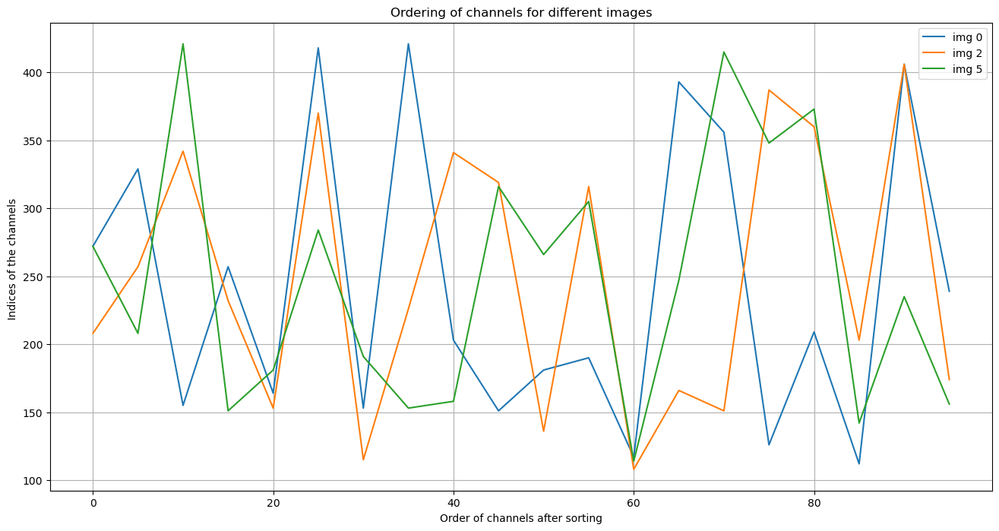

In [31]:
indices = list(range(0,100,5))
img0_order = [ list(scatter_list[0])[i] for i in indices]
img2_order = [ list(scatter_list[2])[i] for i in indices]
img5_order = [ list(scatter_list[5])[i] for i in indices]


plt.figure(figsize = (16,8))
plt.plot(indices, img0_order)
plt.plot(indices, img2_order)
plt.plot(indices, img5_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["img 0", "img 2", "img 5"])
plt.title("Ordering of channels for different images")
plt.legend(["img 0", "img 2", "img 5"])
plt.grid()
plt.show()

__Hence it shows that our ordering appraoch does not order uniformly across all the images__

# Alternative

### What if we order the channels for one image and apply the same order to all images?

In [14]:
# This function gives me order of channels for image
def filter_channels_using_oneImg(embedding_vectors, a, b, rand_int):
    embed_np = embedding_vectors.copy()
    _imgs = []
    img_id = rand_int
    image = embed_np[img_id]
    # stores all the distances of channel and its fft
    channel_dist = {}
    channel_dict = {}
    for channel_id, channel in enumerate(image):
        channel_dist[channel_id] = calculateDistance(channel)
        channel_dict[channel_id] = channel
    # Sort the dictionary
    channel_dist = dict(sorted(channel_dist.items(), key=lambda item: item[1]))
    # we take the index of this dictionary and seelct the top ones
    # Based on the index of the top ones, we slice the dictionary
    return torch.index_select(torch.tensor(embed_np), 1, torch.tensor(list(channel_dist.keys())[a:b])), torch.tensor(list(channel_dist.keys())[a:b])

In [15]:
# Random id
img_id = random.randint(0,train_embed.shape[0])

# Slice the low order, medium order and high order channels
# We want to see how the performance changes for using each band of ordering
low_sorted_embed, low_order = filter_channels_using_oneImg(train_embed, 0, 100, img_id)
high_sorted_embed, high_order = filter_channels_using_oneImg(train_embed, 300, 400, img_id)
mid_sorted_embed, mid_order = filter_channels_using_oneImg(train_embed, 100, 300, img_id)

/home/jovyan/notebooks/final project/fft_filter_normalized.py:106: RuntimeWarning: invalid value encountered in divide
  img = img / (_max - _min)
/home/jovyan/notebooks/final project/fft_filter_normalized.py:41: RuntimeWarning: invalid value encountered in cast
  img_mandp = np.uint8(np.abs(np.fft.ifft2(img_mandp)))
/home/jovyan/notebooks/final project/fft_filter_normalized.py:44: RuntimeWarning: invalid value encountered in divide
  img_mandp=img_mandp/np.max(img_mandp)*255


For each order type, we plot rank of the channel vs the index of the channel in the embedding vector. This is for understanding our data 

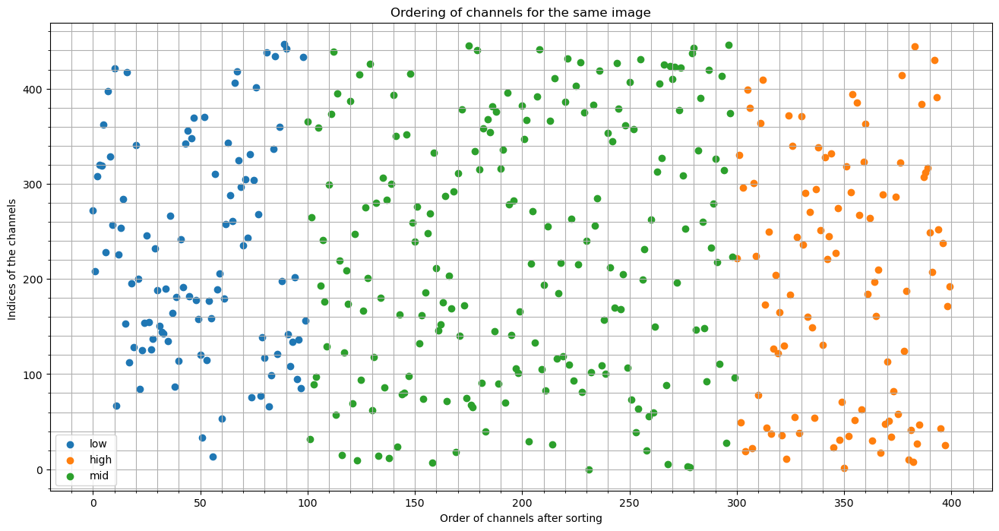

In [16]:
fig, ax = plt.subplots(figsize = (16,8))
plt.scatter(list(range(0,100)), low_order)
plt.scatter(list(range(300,400)), high_order)
plt.scatter(list(range(100,300)), mid_order)
plt.xlabel("Order of channels after sorting")
plt.ylabel("Indices of the channels ")
plt.legend(["low", "high", "mid"])
plt.title("Ordering of channels for the same image")
# Enabling minor grid lines:
ax.grid(which = "both")
ax.minorticks_on()

plt.show()

We do not see some obvious trait for each kind of ordering.

### Find normal distribution

In [17]:
gaussian_list = []

for x_embed in [low_sorted_embed, mid_sorted_embed, high_sorted_embed]:
    mean, cov = get_gaussian(x_embed)
    gaussian_list.append([mean, cov])

### Find distance and score

In [18]:
# List of score for each order type
scores = []
for k, _order in enumerate([low_order, mid_order, high_order]):
    # Slice the embedding based on order
    embedding_vectors = torch.index_select(torch.tensor(test_embed), 1, _order)
    # Get score
    _scores = get_scores(embedding_vectors,gaussian_list[k])
    scores.append(_scores)

# Plot

low


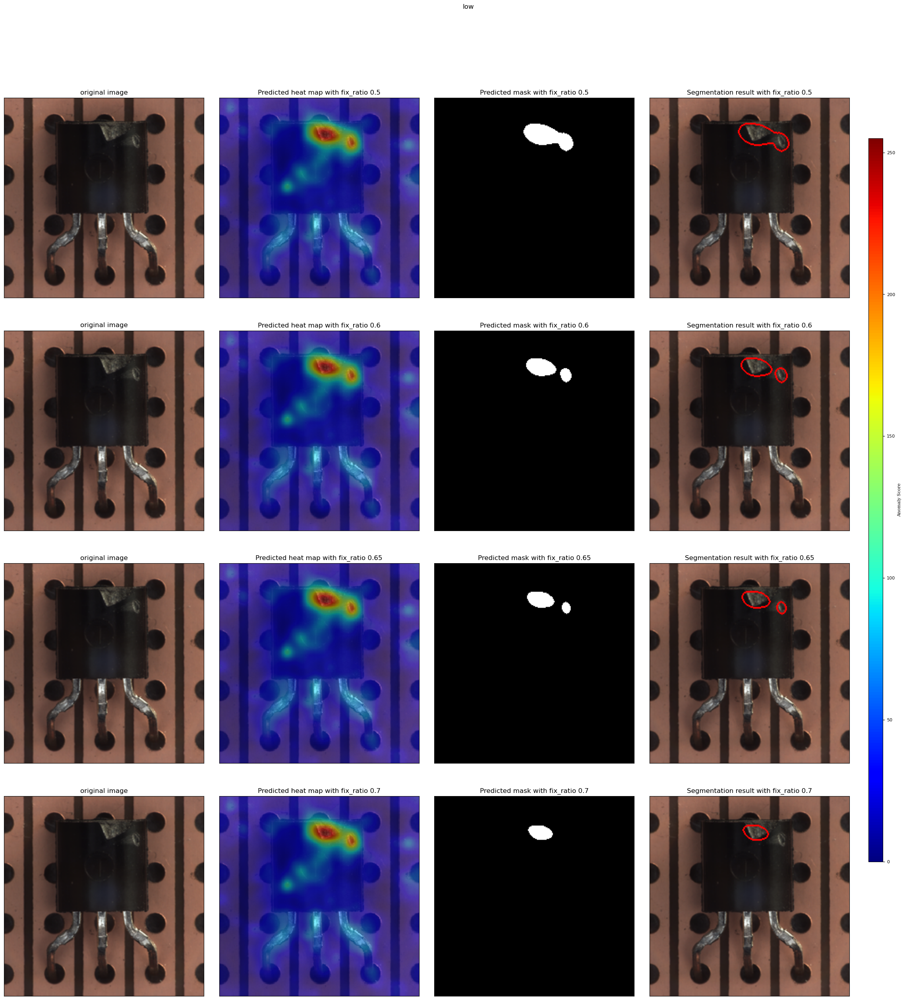

mid


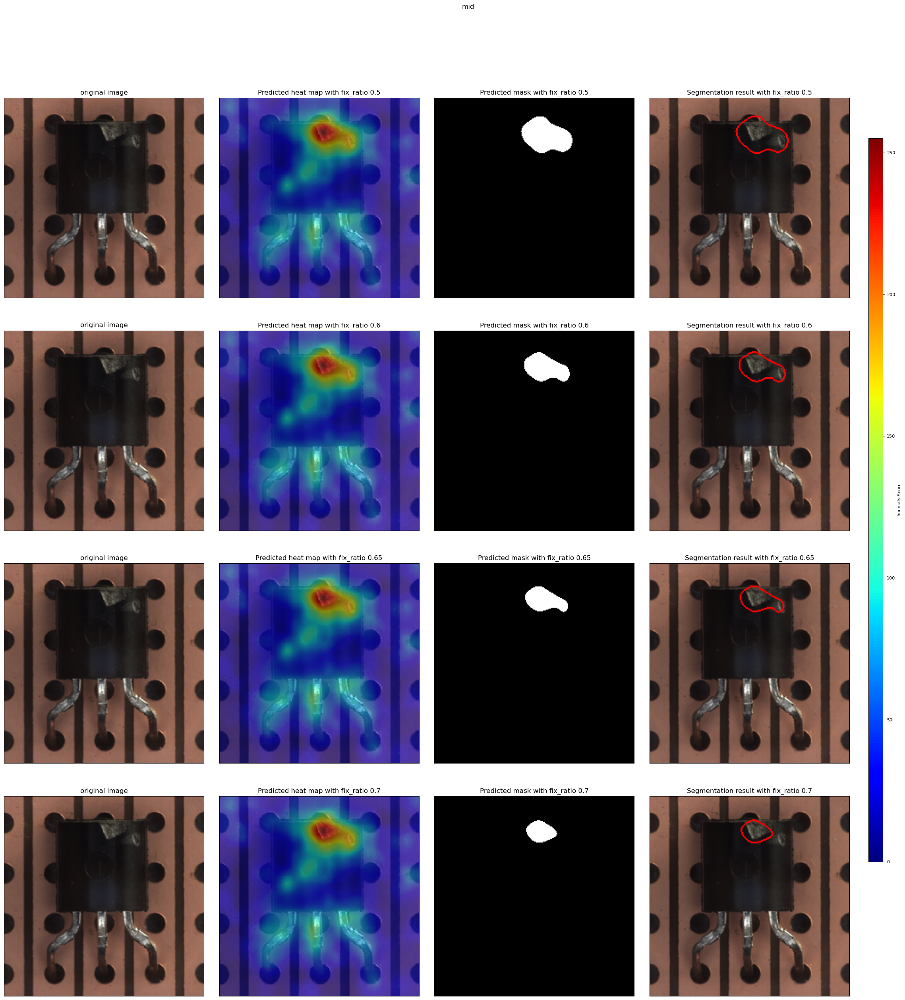

high


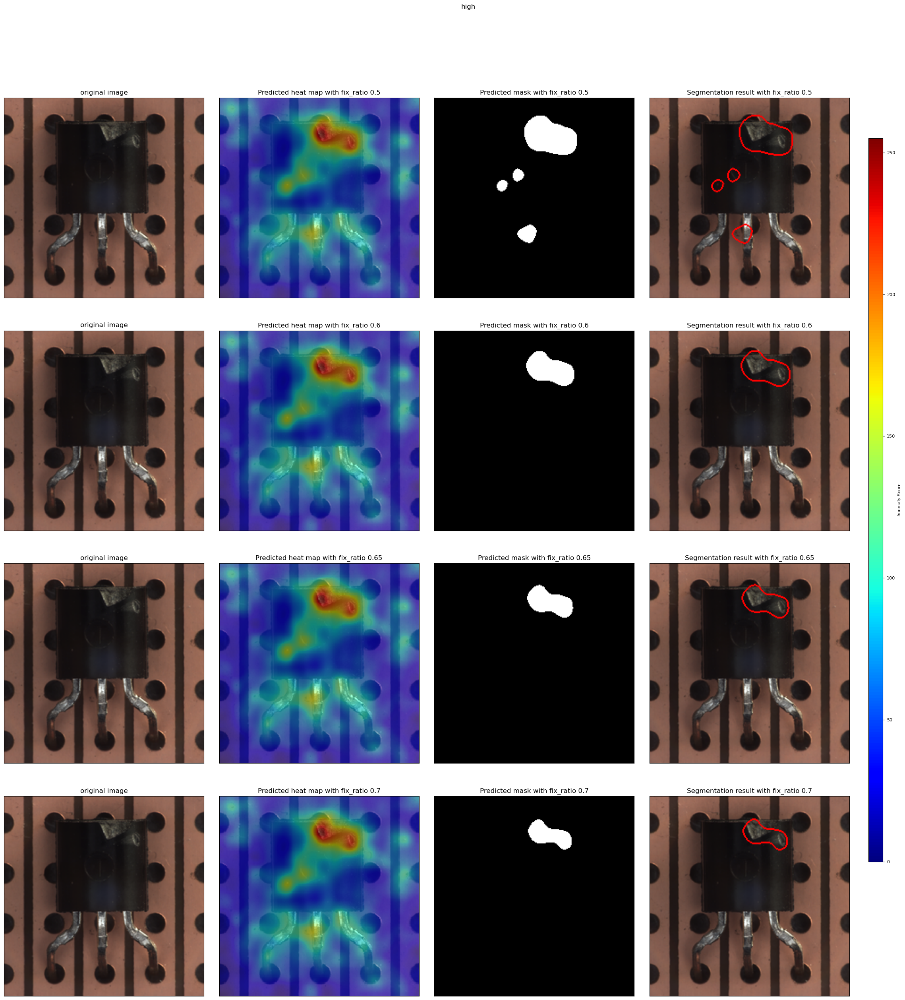

In [19]:
save = False
fix_ratios = [0.5, 0.6, 0.65, 0.7]
orders = ["low", "mid", "high"]
for j in range(3):
    print(orders[j])
    plot_fig(test_imgs_224 ,scores[j], fix_ratios, "", title = orders[j])

This is a good place to start with for further exploration. Next idea is to use mix anomaly images in training set as well since this work uses training images without any anamoly.

## If you want to save the result

In [ ]:
# extra = "mid_Order"
# save_dir = file_location + transistor_path +"results/"+ f'pictures' + "_"+ extra
# save_dir

In [ ]:
# os.makedirs(save_dir, exist_ok=True)
# fix_ratios = [0.5, 0.6, 0.65, 0.7]
# plot_fig(test_imgs ,scores, fix_ratios, save_dir)

# What models to use

I already used a sample model before. Gaussian model here finds the gaussian distribution for classification of each patch.

The another model I could use is KNN.

# Closing Thoughts and Final Goals

Although the test using the order above worked, it is hard to tell if it was by random since the random slection of channel worked too. <br>
Next is I want to try this approach after training the gaussian distribution using transistor images with anomaly. At the end, my main goal is to filter channel out that corresponds to anomalies.